In [22]:
dataname="trg_multi"

#files=glob.glob('*.png')
#fname=files[3]
#fname="../../slide-2019-09-24T09-52-40-R1-S1.mrxs.png"
fname = 'testmuscle.png'

In [23]:
class_names=["Fat", "Muscular", "Vessle", "Gland", "Stroma", "Tumor", "Necrosis", "Epithelium"]
nclasses=len(class_names)

In [24]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import scipy.signal
import argparse
from torch import nn
from torchsummary import summary

from skimage import color 

from albumentations import *
from albumentations.pytorch import ToTensor

import sklearn.feature_extraction.image

import matplotlib.cm

import torch

from torchvision.models import DenseNet

from tqdm.autonotebook import tqdm

from  skimage.color import rgb2gray
import PIL

import glob

import dill as pickle

from skimage.color import rgb2gray, rgb2hed

from skimage.measure import * 
from skimage.filters import *
from skimage.morphology import *


In [25]:
def blend2Images(img, mask):
    if (img.ndim == 3):
        img = color.rgb2gray(img)
    if (mask.ndim == 3):
        mask = color.rgb2gray(mask)
    img = img[:, :, None] * 1.0  # can't use boolean
    mask = mask[:, :, None] * 1.0
    out = np.concatenate((mask, img, mask), 2)
    return out

In [26]:
resize_resolutions=[1,.25] #resize input image, base and second

patch_size=64
patch_size_res2 = int(patch_size  * 1/resize_resolutions[1])
mirror_pad_size = patch_size_res2

batch_size=128 #should be a power of 2

cmap= matplotlib.cm.tab10


In [27]:
device = torch.device('cuda')
checkpoint = torch.load("./Backup/multires-v0.pth", map_location=lambda storage, loc: storage)

In [28]:
from  MultiResSmallNetwork import MergeSmallNetworks
model=MergeSmallNetworks(nclasses = nclasses, outputsize = 8 ).to(device)
model.load_state_dict(checkpoint["model_dict"])

<All keys matched successfully>

In [29]:
#summary(model.res1,input_size=(3,64,64))

In [30]:
#summary(model.res1.encoder,input_size=(3,64,64))

In [31]:
def divide_batch(l, n): 
    for i in range(0, l.shape[0], n):  
        yield l[i:i + n,::] 

In [32]:
img = cv2.cvtColor(cv2.imread(fname),cv2.COLOR_BGR2RGB)
img= cv2.resize(img,(0,0),fx=resize_resolutions[0],fy=resize_resolutions[0], interpolation=PIL.Image.BICUBIC) #resize it as specified above
img = np.pad(img, [(mirror_pad_size, mirror_pad_size), (mirror_pad_size, mirror_pad_size), (0, 0)], mode="reflect")

In [33]:
hed=rgb2hed(img)
mask=hed[:,:,0]>-.8
mask=remove_small_objects(mask,150)

In [34]:
mask[img.sum(axis=2)<100]=0

mask[img.sum(axis=2)>700]=0

mask[0:patch_size_res2,:]=0;
mask[:,0:patch_size_res2]=0;

mask[:,-patch_size_res2-1:]=0
mask[-patch_size_res2-1:,:]=0

In [35]:
import scipy.ndimage as ndimage
mask=ndimage.binary_fill_holes(mask).astype(int)

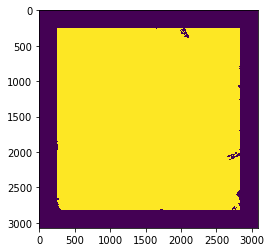

In [38]:
%matplotlib inline
plt.imshow(mask)
plt.show()

In [44]:
def random_subset(a, b, nitems):
    assert len(a) == len(b)
    idx = np.random.randint(0,len(a),nitems)
    return a[idx], b[idx]

In [45]:
def subset(a, b, nitems):
    assert len(a)==len(b)
    idx = np.arange(0, len(a), len(a)//nitems)
    return a[idx], b[idx]

In [46]:
max_number_samples=100000
[rs,cs]=mask.nonzero()
[rs,cs]=subset(rs,cs,max_number_samples)
#[rs,cs]=random_subset(rs,cs,max_number_samples)
centers = [ (r,c) for r,c in zip(rs,cs)]
npatches=len(centers)

arr_out_res1 = np.zeros((npatches,3,patch_size,patch_size))
arr_out_res2 = np.zeros((npatches,3,patch_size,patch_size))

In [47]:
img_transform = Compose([
       ToTensor()
    ])

In [48]:
rs=[]
cs=[]
for i, (r,c) in tqdm(enumerate(centers), total = len(centers)):
    r=int(round(r))
    c=int(round(c))
    rs.append(r)
    cs.append(c)

    imgres1 = img[r-patch_size//2:r+patch_size//2,c-patch_size//2:c+patch_size//2,:]
            
    imgres2 = img[r-patch_size_res2//2:r+patch_size_res2//2,c-patch_size_res2//2:c+patch_size_res2//2,:]
    imgres2 = cv2.resize(imgres2,(patch_size,patch_size), interpolation=PIL.Image.BICUBIC) #resize it as specified above

    
    arr_out_res1[i,:,:,:] = img_transform(image=imgres1)["image"]
    arr_out_res2[i,:,:,:] = img_transform(image=imgres2)["image"]

    
    

In [49]:
clusterids=[]
for batch_arr_res1, batch_arr_res2 in tqdm(zip(divide_batch(arr_out_res1,batch_size),divide_batch(arr_out_res2,batch_size))):

    #arr_out_gpu = torch.from_numpy(batch_arr.transpose(0, 3, 1, 2) / 255).type('torch.FloatTensor').to(device)
    arr_out_gpu_res1 =  torch.from_numpy(batch_arr_res1).type('torch.FloatTensor').to(device)
    arr_out_gpu_res2 =  torch.from_numpy(batch_arr_res2).type('torch.FloatTensor').to(device)

    # ---- get results
    clusterids.append(torch.argmax( model.dualfoward(arr_out_gpu_res1,arr_out_gpu_res2),dim=1).detach().cpu().numpy())
clusterids=np.hstack(clusterids)

<IPython.core.display.Javascript object>


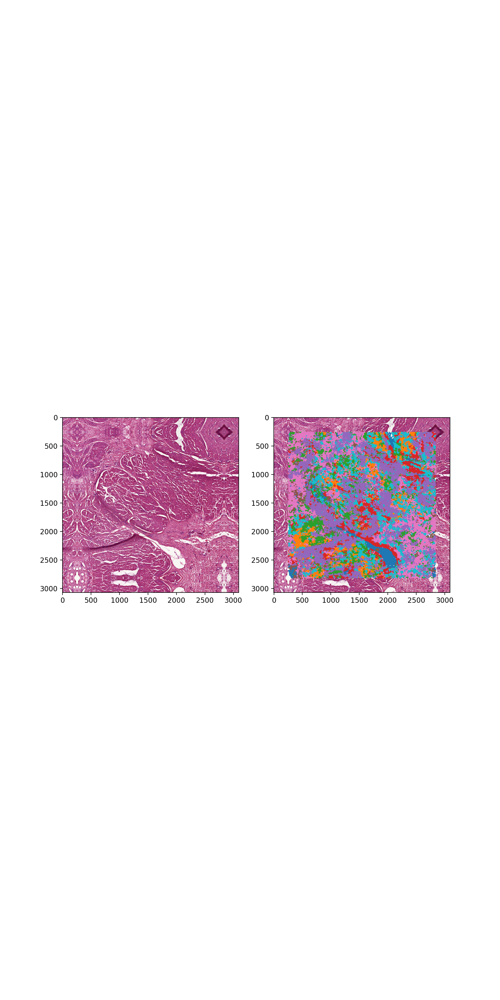

In [52]:
%matplotlib notebook
#cdict = ['tab:blue','tab:orange','tab:red','tab:brown','tab:pink', 'tab:green', 'tab:cyan', 'tab:purple']
plt.rcParams["figure.figsize"] = [10, 20]
fig, (ax1, ax2) = plt.subplots(1, 2)
ax2.imshow(img)
ax1.imshow(img)
for i in range(len(class_names)):
    c = [cs[j] for j in range(len(centers)) if clusterids[j]==i]
    r = [rs[j] for j in range(len(centers)) if clusterids[j]==i]
    cl = [x for x in clusterids if x == i]  
    scatter = ax2.scatter(c, r, c=cdict[i], label = class_names[i], s=0.5)

# produce a legend with the unique colors from the scatter
#legend1 = ax1.legend(loc="upper center", ncol=3, fancybox=False)
#ax1.add_artist(legend1)

plt.show()
fig.savefig('./Output/uniformmuscle.png', dpi = 700, bbox= 'tight')

In [ ]:
plt.savefig('output-v0.png', dpi = 1000)

SLIC number of segments: 2606


<IPython.core.display.Javascript object>


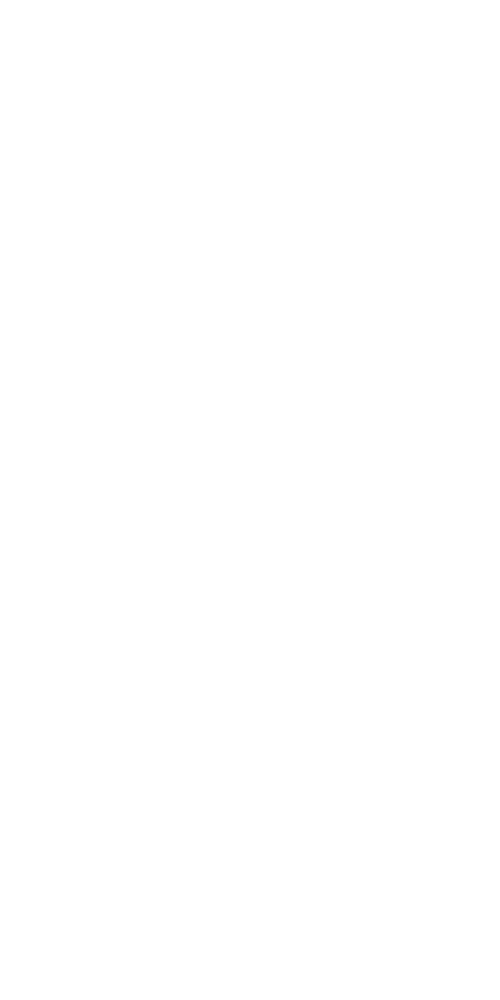

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<IPython.core.display.Javascript object>


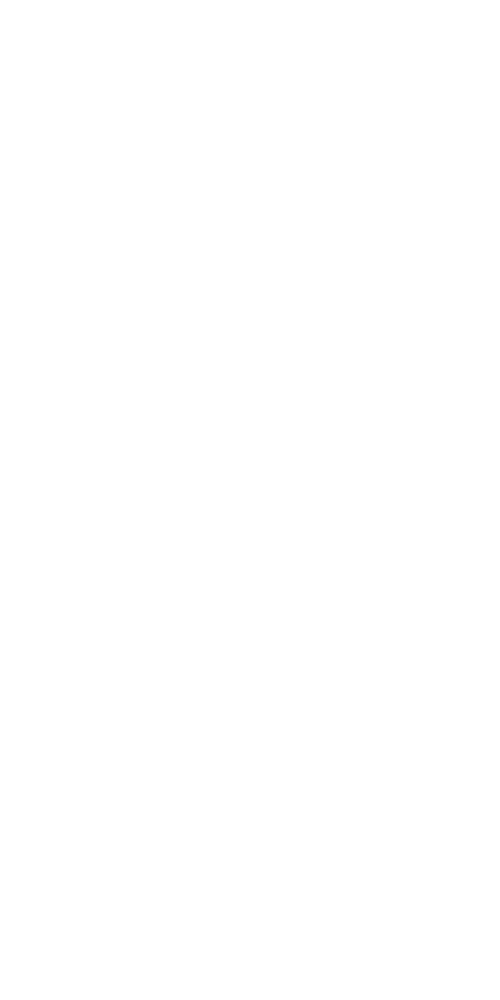

In [122]:
#SLIC
import matplotlib.pyplot as plt
import numpy as np
from skimage.data import astronaut
from skimage.color import rgb2gray
from skimage.filters import sobel
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
img = img_as_float(cv2.imread(fname)[::2, ::2])
segments_slic = slic(img, n_segments=5000, compactness=10, sigma=1, enforce_connectivity=True)
print(f"SLIC number of segments: {len(np.unique(segments_slic))}")
%matplotlib notebook
plt.rcParams["figure.figsize"] = [10, 20]
fig, ax = plt.subplots()
ax.imshow(mark_boundaries(img, segments_slic, color=(50, 50, 0), outline_color=(10, 10, 10), background_label=0))

<IPython.core.display.Javascript object>


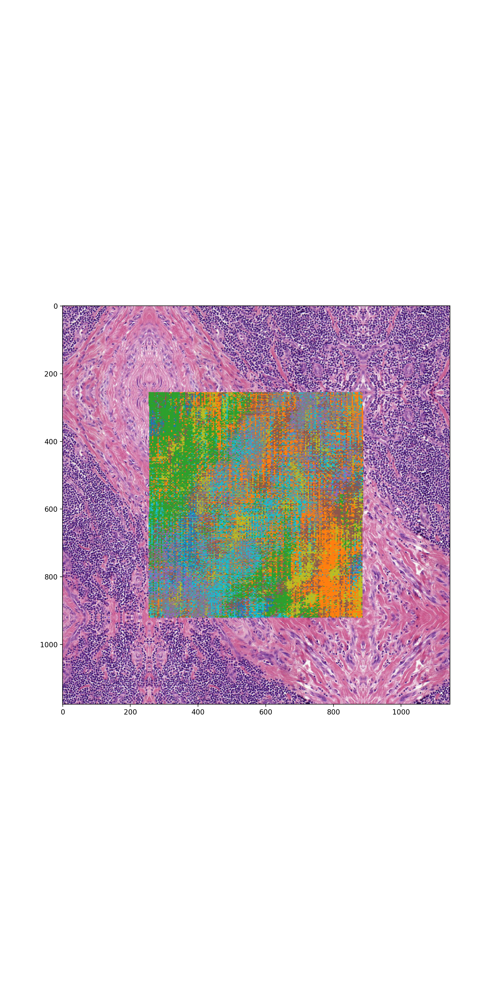

In [69]:
%matplotlib notebook
plt.rcParams["figure.figsize"] = [10, 20]
fig, ax = plt.subplots()
ax.imshow(img)
ax.scatter(cs,rs,c=clusterids,cmap=cmap,s=1)

In [67]:
from collections import Counter
Counter(clusterids)

Counter({2: 19121,
         4: 17185,
         1: 19484,
         6: 10362,
         0: 3623,
         7: 15659,
         5: 13532,
         3: 5940})

In [68]:
C = [(float(cs[j]), float(rs[j])) for j in range(len(centers)) if clusterids[j]==4] 

In [53]:
def saveList(myList,filename):
    # the filename should mention the extension 'npy'
    np.save(filename,myList)
    print("Saved successfully!")

In [54]:
def loadList(filename):
    # the filename should mention the extension 'npy'
    tempNumpyArray=np.load(filename)
    return tempNumpyArray.tolist()

In [36]:
# save the list of tumor points
saveList(C,'tumorpoints.npy')

Saved successfully!


In [48]:
# loading the list now 
vessles=loadList('vessles.npy')

In [59]:
import sys
from descartes import PolygonPatch
import matplotlib.pyplot as plt
import alphashape
alpha_shape = alphashape.alphashape(C, 0.009)

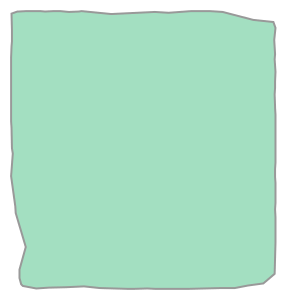

In [60]:
alpha_shape

<IPython.core.display.Javascript object>


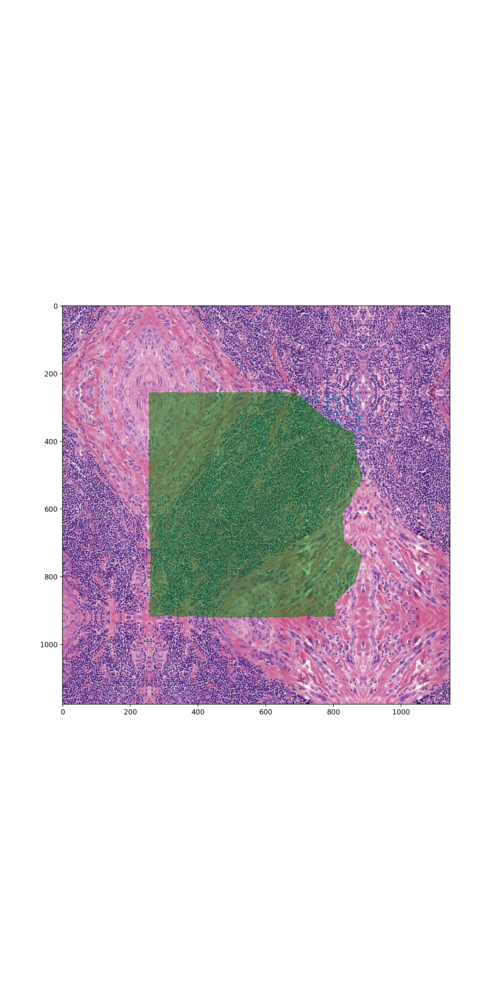

In [51]:
%matplotlib notebook
plt.rcParams["figure.figsize"] = [10, 20]
#ax.scatter(cs,rs,c=clusterids,cmap=cmap,s=1)
fig, ax = plt.subplots()
ax.imshow(img)
ax.scatter(*zip(*tumorpoints), s=1)
ax.add_patch(PolygonPatch(alpha_shape, alpha=0.5, color = 'green'))
plt.show()

In [176]:
fig.savefig('hull-multires.png', bbox_inches='tight', dpi=1000)

In [177]:
from shapely.geometry import shape
shape(alpha_shape).area 

3788179.5

<IPython.core.display.Javascript object>


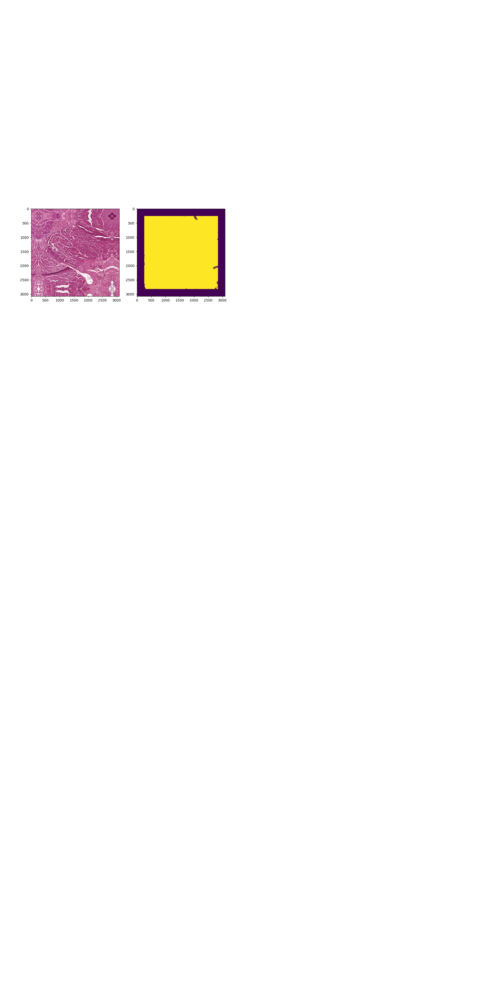

NameError: name 'centers' is not defined

In [21]:
%matplotlib notebook
from matplotlib.colors import ListedColormap
cdict = ['tab:blue','tab:orange','tab:red','tab:brown','tab:pink', 'tab:green', 'tab:cyan', 'tab:purple']
plt.rcParams["figure.figsize"] = [10, 20]
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(img)
ax2.imshow(img)
for i in range(len(class_names)):
    c = [cs[j] for j in range(len(centers)) if clusterids[j]==i]
    r = [rs[j] for j in range(len(centers)) if clusterids[j]==i]
    cl = [x for x in clusterids if x == i]  
    scatter = ax1.scatter(c, r, c=cdict[i], label = class_names[i], s=0.5)

# produce a legend with the unique colors from the scatter
legend1 = ax1.legend(loc="upper center", ncol=3, fancybox=False)
ax1.add_artist(legend1)

plt.show()

In [ ]:
fig.savefig('out-multires'+ fname, bbox_inches='tight', dpi=1000)

In [8]:
!pip install scikit-learn==0.21

Defaulting to user installation because normal site-packages is not writeable
  Using cached scikit_learn-0.21.0-cp36-cp36m-manylinux1_x86_64.whl (6.6 MB)
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.22.2.post1
    Uninstalling scikit-learn-0.22.2.post1:
      Successfully uninstalled scikit-learn-0.22.2.post1


In [20]:
matplotlib.cm.tab10(0)

(0.12156862745098039, 0.4666666666666667, 0.7058823529411765, 1.0)